## Création et visualisation

### imports

In [13]:
from IPython.display import SVG
from sknetwork.data import from_edge_list, from_adjacency_list, from_graphml, from_csv
from sknetwork.visualization import visualize_graph, visualize_bigraph
from sknetwork.clustering import Louvain, get_modularity
from networkx.algorithms.community import louvain_communities
from collections import Counter, defaultdict


In [14]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as c
from networkx.algorithms import community 
import numpy as np

In [15]:
import pandas as pd
df = pd.read_csv("articles.csv")


In [16]:
math_cs_authors = df[df["category"].str.contains("math|cs", case=False, na=False)]["authors"] #len 1120542
math_authors = df[df["category"].str.contains("math.", case=False, na=False)]["authors"] #len 455866 
cs_authors = df[df["category"].str.contains("cs.", case=False, na=False)]["authors"] #len 455866
economy_authors = df[df["category"].str.contains("eco", case=False, na=False)]["authors"] #len 14794

### Créer un dataset des articles en Statistiques, Maths, Economie et Data Science
C'est ce datatset qu'on va utiliser et analyser

In [ ]:
df_science = df[df["category"].str.contains("stat.|math.|econ.|cs.", case=False, na=False)
                & ~df["category"].str.contains("physics|cond-mat", case=False, na=False) & ~
                df["authors"].str.contains("Honghao", case=False, na=False)]
print(df_science.columns)
print(df_science.shape)
df_science.head()

Index(['id', 'title', 'summary', 'category', 'authors', 'published',
       'updated'],
      dtype='object')
(984439, 7)


,id,title,summary,category,authors,published,updated
12,http://arxiv.org/abs/2503.01843v2,When Can You Get Away with Low Memory Adam?,Adam is the go-to optimizer for training moder...,cs.LG,"Dayal Singh Kalra, John Kirchenbauer, Maissam ...",2025-03-03T18:59:40Z,2025-03-06T18:38:33Z
16,http://arxiv.org/abs/2502.21269v1,Dynamical Decoupling of Generalization and Ove...,The inductive bias and generalization properti...,stat.ML,"Andrea Montanari, Pierfrancesco Urbani",2025-02-28T17:45:26Z,2025-02-28T17:45:26Z
31,http://arxiv.org/abs/2502.18964v1,Variational representation and estimates for t...,Random walks with a disordered self-interactio...,math.PR,Julien Poisat,2025-02-26T09:22:14Z,2025-02-26T09:22:14Z
38,http://arxiv.org/abs/2502.18553v2,Applications of Statistical Field Theory in De...,Deep learning algorithms have made incredible ...,stat.ML,"Zohar Ringel, Noa Rubin, Edo Mor, Moritz Helia...",2025-02-25T18:19:06Z,2025-02-28T07:45:02Z
66,http://arxiv.org/abs/2502.10390v1,(How) Can Transformers Predict Pseudo-Random N...,Transformers excel at discovering patterns in ...,cs.LG,"Tao Tao, Darshil Doshi, Dayal Singh Kalra, Tia...",2025-02-14T18:59:40Z,2025-02-14T18:59:40Z


In [89]:
# Affiche le nombre de lignes où un nom apparaît plusieurs fois dans la même liste d'auteurs
def has_duplicate_author(authors_str):
    authors = [a.strip() for a in authors_str.split(",")]
    return len(authors) != len(set(authors))

nb_duplicates = df["authors"].apply(has_duplicate_author).sum()
# Supprimer les lignes où un nom apparaît plusieurs fois dans la même liste d'auteurs
mask_no_duplicates = ~df_science["authors"].apply(has_duplicate_author)
df_science = df_science[mask_no_duplicates]

# Supprimer les lignes avec des résumés (summary) identiques (on garde la première occurrence)
df_science = df_science.drop_duplicates(subset="summary", keep="first")
print(f"Après nettoyage : {len(df_science)} lignes restantes.")


Après nettoyage : 694794 lignes restantes.


In [42]:
df_science.head(8)

,id,title,summary,category,authors,published,updated
12,http://arxiv.org/abs/2503.01843v2,When Can You Get Away with Low Memory Adam?,Adam is the go-to optimizer for training moder...,cs.LG,"Dayal Singh Kalra, John Kirchenbauer, Maissam ...",2025-03-03T18:59:40Z,2025-03-06T18:38:33Z
16,http://arxiv.org/abs/2502.21269v1,Dynamical Decoupling of Generalization and Ove...,The inductive bias and generalization properti...,stat.ML,"Andrea Montanari, Pierfrancesco Urbani",2025-02-28T17:45:26Z,2025-02-28T17:45:26Z
31,http://arxiv.org/abs/2502.18964v1,Variational representation and estimates for t...,Random walks with a disordered self-interactio...,math.PR,Julien Poisat,2025-02-26T09:22:14Z,2025-02-26T09:22:14Z
38,http://arxiv.org/abs/2502.18553v2,Applications of Statistical Field Theory in De...,Deep learning algorithms have made incredible ...,stat.ML,"Zohar Ringel, Noa Rubin, Edo Mor, Moritz Helia...",2025-02-25T18:19:06Z,2025-02-28T07:45:02Z
66,http://arxiv.org/abs/2502.10390v1,(How) Can Transformers Predict Pseudo-Random N...,Transformers excel at discovering patterns in ...,cs.LG,"Tao Tao, Darshil Doshi, Dayal Singh Kalra, Tia...",2025-02-14T18:59:40Z,2025-02-14T18:59:40Z
81,http://arxiv.org/abs/2502.07998v1,Adaptive kernel predictors from feature-learni...,Previous influential work showed that infinite...,cs.LG,"Clarissa Lauditi, Blake Bordelon, Cengiz Pehlevan",2025-02-11T22:34:49Z,2025-02-11T22:34:49Z
84,http://arxiv.org/abs/2502.06739v1,A note on the physical interpretation of neura...,We highlight a formal and substantial analogy ...,cs.LG,Sauro Succi,2025-02-10T18:07:51Z,2025-02-10T18:07:51Z
87,http://arxiv.org/abs/2502.05300v1,Parameter Symmetry Breaking and Restoration De...,The dynamics of learning in modern large AI sy...,cs.LG,"Liu Ziyin, Yizhou Xu, Tomaso Poggio, Isaac Chuang",2025-02-07T20:10:05Z,2025-02-07T20:10:05Z


### Create a CSV with collaboration authors from stats, maths, computer science and economy
Columns: "author1", "author2", "weight", "category"

In [97]:
import csv, unicodedata
from collections import defaultdict
from itertools import combinations

def clean(name: str) -> str:
    n = unicodedata.normalize("NFKC", name.strip())
    n = " ".join(n.split())
    return n

def create_csv(name, dataset=df):
    conditions = [
        dataset["category"].str.contains("stat\\.", case=False, na=False),
        dataset["category"].str.contains("math\\.", case=False, na=False),
        dataset["category"].str.contains("cs\\.",   case=False, na=False),
        dataset["category"].str.contains("econ\\.", case=False, na=False)
    ]
    choices = ["stat", "math", "cs", "econ"]
    dataset["category"] = np.select(conditions, choices, default=dataset["category"])

    coauthor_counts = defaultdict(int)

    for i, authors in enumerate(dataset["authors"]):
        category = dataset["category"].iat[i]
        authors_set = {clean(a) for a in authors.split(",") if a.strip()}
        for a1, a2 in combinations(sorted(authors_set), 2):
            coauthor_counts[(a1, a2, category)] += 1

    with open(name, "w", newline="", encoding="utf-8") as f:
        writer = csv.writer(f)
        writer.writerow(["author1", "author2", "weight", "category"])
        for (a1, a2, cat), w in coauthor_counts.items():
            writer.writerow([a1, a2, w, cat])

    print(f"CSV sauvegardé sous « {name} »")


In [98]:
create_csv("science_collaboration_cat&wight.csv", df_science)

CSV sauvegardé sous « science_collaboration_cat&wight.csv »


### Create a networks non directed graph of a csv authors
    - fonction qui crée le graph
    - histogramme de la distrubution du poids des arrêtes
    - histogramme de la distribution des degrés des noeuds (somme des poids de ses arrêtes)


In [99]:
def nonDirected_graph(file, filter_weight=None, samples=None):
    ''' Create a Graph from
    file: collaboration csv with 4 columns: author1, author2, weight, category
    filter_weight: if we want to display only authors that have more than filter_weight collaborations
    samples: if the csv is too heavy, use only some samples taken randomly from the dataset
    '''
    df = pd.read_csv(file)

    # eliminate lines which weight isn't relevant
    if filter_weight is not None:
        df_filtered = df[df["weight"] > filter_weight]
        df = df_filtered
    
    # take randomly n samples
    if samples is not None:
        df_sample = df.sample(n=samples, random_state=42)  # random_state for reproducibility
        df = df_sample

    # Create non-directed graph
    G = nx.Graph()

    # Add weight and category as attributes to the edges
    for _, row in df.iterrows():
        G.add_edge(row["author1"], row["author2"], weight=row["weight"], category=row["category"])
        
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    
    return G


In [100]:
#Graph with all the authors (even if they have only one collaboration)
G_science= nonDirected_graph("science_collaboration_cat&wight.csv", filter_weight=0) 

import pickle
# Save the object graph in a pickle file for later use
with open('G_science.pkl', 'wb') as f:
    pickle.dump(G_science, f)

Number of nodes: 581712
Number of edges: 3195437


In [24]:
import pickle

with open('G_science.pkl', 'rb') as f:
    G_science = pickle.load(f) 

In [102]:
print(f"Number of nodes: {G_science.number_of_nodes()}")
print(f"Number of edges: {G_science.number_of_edges()}")

Number of nodes: 581712
Number of edges: 3195437


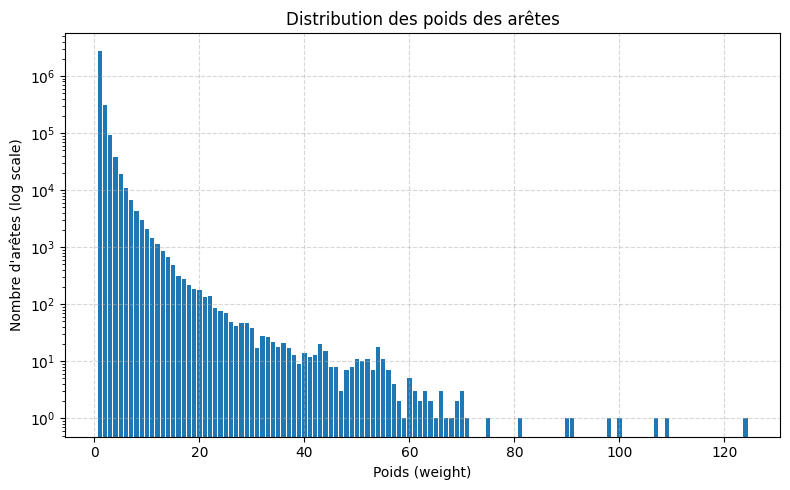

In [112]:
from collections import Counter

# 1. Récupérer tous les poids des arêtes
weights = [edata['weight'] for _, _, edata in G_science.edges(data=True)]

# 2. Compter combien de fois chaque poids apparaît
weight_counts = Counter(weights)

# 3. Trier les poids et leurs fréquences
weights, counts = zip(*sorted(weight_counts.items()))

# 4. Tracer l'histogramme
plt.figure(figsize=(8, 5))
plt.bar(weights, counts, log=True)  # Utiliser une échelle logarithmique pour l'axe Y
plt.xlabel("Poids (weight)")
plt.ylabel("Nombre d'arêtes (log scale)")
plt.title("Distribution des poids des arêtes")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


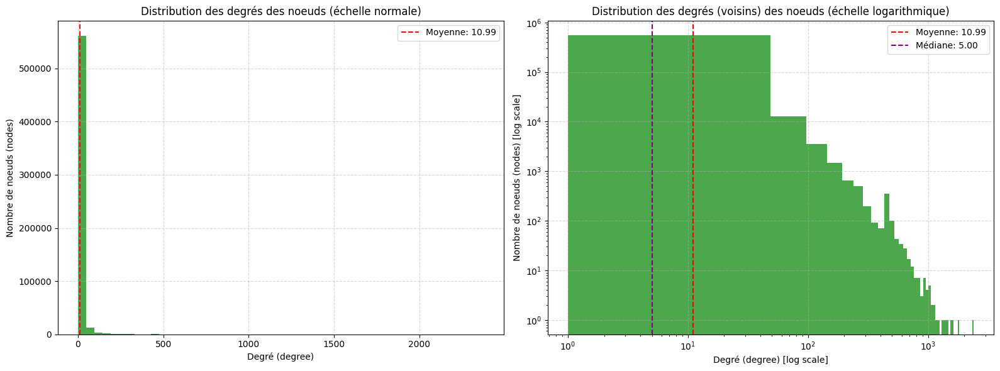

In [138]:
# Distribution des degrés des noeuds
degree_sequence = sorted([d for n, d in G_science.degree()], reverse=True)  # degree sequence

# Créer une figure avec deux sous-graphiques côte à côte
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Histogramme avec échelle normale (à gauche)
axes[0].hist(degree_sequence, bins=50, color='green', alpha=0.7)
axes[0].axvline(np.mean(degree_sequence), color='red', linestyle='--', label=f'Moyenne: {np.mean(degree_sequence):.2f}')
axes[0].set_xlabel("Degré (degree)")
axes[0].set_ylabel("Nombre de noeuds (nodes)")
axes[0].set_title("Distribution des degrés des noeuds (échelle normale)")
axes[0].grid(True, linestyle="--", alpha=0.5)
axes[0].legend()

# Histogramme avec échelle logarithmique (à droite)
axes[1].hist(degree_sequence, bins=50, color='green', alpha=0.7, log=True)  # Log scale for y-axis
axes[1].axvline(np.mean(degree_sequence), color='red', linestyle='--', label=f'Moyenne: {np.mean(degree_sequence):.2f}')
axes[1].axvline(np.median(degree_sequence), color='purple', linestyle='--', label=f'Médiane: {np.median(degree_sequence):.2f}')
axes[1].set_xscale('log')  # Log scale for x-axis
axes[1].set_xlabel("Degré (degree) [log scale]")
axes[1].set_ylabel("Nombre de noeuds (nodes) [log scale]")
axes[1].set_title("Distribution des degrés (voisins) des noeuds (échelle logarithmique)")
axes[1].grid(True, linestyle="--", alpha=0.5)
axes[1].legend()

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()
plt.show()


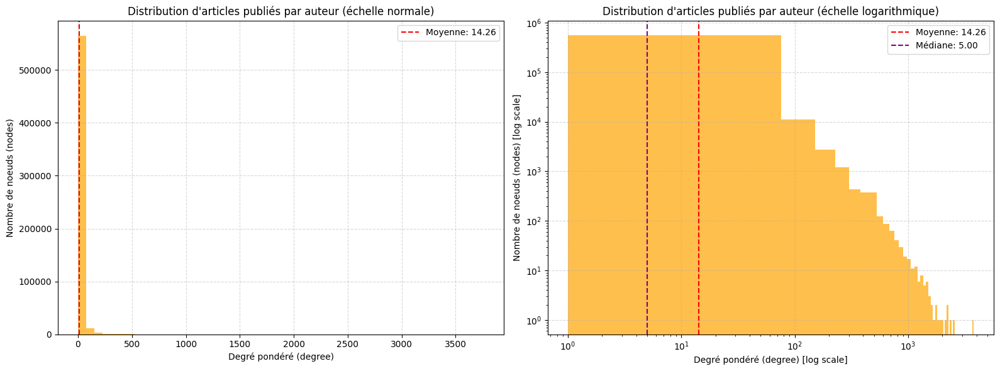

In [139]:
# Distribution des degrés des noeuds
degree_sequence = sorted([d for n, d in G_science.degree(weight='weight')], reverse=True)  # ponderated degree sequence

# Créer une figure avec deux sous-graphiques côte à côte
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Histogramme avec échelle normale (à gauche)
axes[0].hist(degree_sequence, bins=50, color='orange', alpha=0.7)
axes[0].axvline(np.mean(degree_sequence), color='red', linestyle='--', label=f'Moyenne: {np.mean(degree_sequence):.2f}')
axes[0].set_xlabel("Degré pondéré (degree)")
axes[0].set_ylabel("Nombre de noeuds (nodes)")
axes[0].set_title("Distribution d'articles publiés par auteur (échelle normale)")
axes[0].grid(True, linestyle="--", alpha=0.5)
axes[0].legend()

# Histogramme avec échelle logarithmique (à droite)
axes[1].hist(degree_sequence, bins=50, color='orange', alpha=0.7, log=True)  # Log scale for y-axis
axes[1].axvline(np.mean(degree_sequence), color='red', linestyle='--', label=f'Moyenne: {np.mean(degree_sequence):.2f}')
axes[1].axvline(np.median(degree_sequence), color='purple', linestyle='--', label=f'Médiane: {np.median(degree_sequence):.2f}')
axes[1].set_xscale('log')  # Log scale for x-axis
axes[1].set_xlabel("Degré pondéré (degree) [log scale]")
axes[1].set_ylabel("Nombre de noeuds (nodes) [log scale]")
axes[1].set_title("Distribution d'articles publiés par auteur (échelle logarithmique)")
axes[1].grid(True, linestyle="--", alpha=0.5)
axes[1].legend()

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()
plt.show()

In [106]:
# Add the primary category to each node based on the edges
primary_cat = {}
for node in G_science:
    cats = [edata['category'] for _, _, edata in G_science.edges(node, data=True)]
    if cats:
        primary_cat[node] = Counter(cats).most_common(1)[0][0] # example: primary_cat[node] = 'cs'
    else:
        primary_cat[node] = None
nx.set_node_attributes(G_science, primary_cat, 'primary_category')

In [141]:
# Trouver l'arête avec le poids maximal
max_weight = max([edata['weight'] for _, _, edata in G_science.edges(data=True)])
for u, v, edata in G_science.edges(data=True):
    if edata['weight'] == max_weight:
        print(f"Les deux auteurs connectés par l'arête de poids maximal ({max_weight}) sont : '{u}' et '{v}'")
        # leur degré
        print(f"Leur degré, càd le nombre de publications est : {G_science.degree(u, weight='weight')}, {G_science.degree(v, weight='weight')}")
        print("leur catégorie principale:")
        print(primary_cat[u], primary_cat[v])
        break

Les deux auteurs connectés par l'arête de poids maximal (124) sont : 'Ciriaco Andrea D'Angelo' et 'Giovanni Abramo'
Leur degré, càd le nombre de publications est : 230, 226
leur catégorie principale:
cs cs


### Communautés avec Louvain et création d'un nouveau attribut

In [103]:
# Add new attribute to the nodes: the community they belong to
communities = louvain_communities(G_science, weight='weight', resolution=1.0) 

membership = {node: cid for cid, comm in enumerate(communities) for node in comm}
nx.set_node_attributes(G_science, membership, 'louvain_community')

#Print the number of communities
print(f"Number of communities: {len(communities)}")

Number of communities: 21062


In [104]:
import pickle
# Save the vraible communities in a pickle file for later use
with open('communities_list.pkl', 'wb') as f:
    pickle.dump(communities, f)


In [27]:
import pickle

with open('communities_list.pkl', 'rb') as f:
    communities = pickle.load(f) 


- Build a node-->community mapping so that membership is a dict with all the 703614 nodes and each node
is asociated with its community (from 1 to 30890)

    - membership = {
    'John Kirchenbauer': 0,
    'Tom Goldstein': 0,
    'Inbar Seroussi':  1,
    .....
    'Blake Bordelo':   30890}

- Then we add a new node attribute called "louvain_community" to each node of the graph so that we can access to the community of each person like this 
    - G_science.nodes['Inbar Seroussi']['louvain_community']

### Visualisation avec Pyvis (interactive)
Noeuds et edges seront coloriés selon la communauté à laquelle ils appartiennent

In [2]:
from pyvis.network import Network
import pandas as pd
import networkx as nx

def visualize_with_pyvis(G, output_file='network.html'):
    """
    Create an interactive visualization of the network using pyvis
    
    Parameters:
    G (nx.Graph): NetworkX graph object
    output_file (str): Name of the HTML file to save the visualization
    """
    # Create a pyvis network
    net = Network(notebook=True, height="750px", width="100%", bgcolor="#222222", font_color="white", cdn_resources='remote')
    
    # Get weights for edge scaling
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    max_weight = max(weights) if weights else 1
    
    # Add nodes and edges to the pyvis network
    for node in G.nodes():
        net.add_node(node, size=10, title=node)
    
    # 3. Add edges with exact weights as widths
    for u, v in G.edges():
        weight = G[u][v]['weight']
        # Scale width (1-10) based on weight
        #width = 1 + 9 * (weight / max_weight)
        net.add_edge(u, v, value=weight, width=weight, title=f"Collaborations: {weight}")
    
    
    # Scale node size by degree:
    degrees = dict(G.degree())
    for node in net.nodes:
        node['size'] = 5 + degrees[node['id']]  # Scale size by degree

    # Color nodes by community:
    communities = community.greedy_modularity_communities(G)
    for i, com in enumerate(communities):
        for node in com:
            net.get_node(node)['color'] = f'hsl({i*60}, 100%, 50%)'

    # Configure physics for better layout
    net.set_options("""
    {
      "physics": {
        "barnesHut": {
          "gravitationalConstant": -80000,
          "centralGravity": 0.3,
          "springLength": 200,
          "springConstant": 0.04,
          "damping": 0.09,
          "avoidOverlap": 0.1
        },
        "minVelocity": 0.75
      }
    }
    """)
    
    # Save and show the network
    net.show(output_file)
    return net


In [ ]:
#Visualiser un sous graphe pour les auteurs qui ont au moins 2 collaborations
sub_G= nonDirected_graph("science_collaboration_cat&wight.csv", filter_weight=1, samples=40000)
visualize_with_pyvis(sub_G, "subgraph_math_cs.html")

Number of nodes: 48062
Number of edges: 39997
subgraph_math_cs.html


<class 'pyvis.network.Network'> |N|=48062 |E|=39,997

## Structure

### Analysis of the created communities

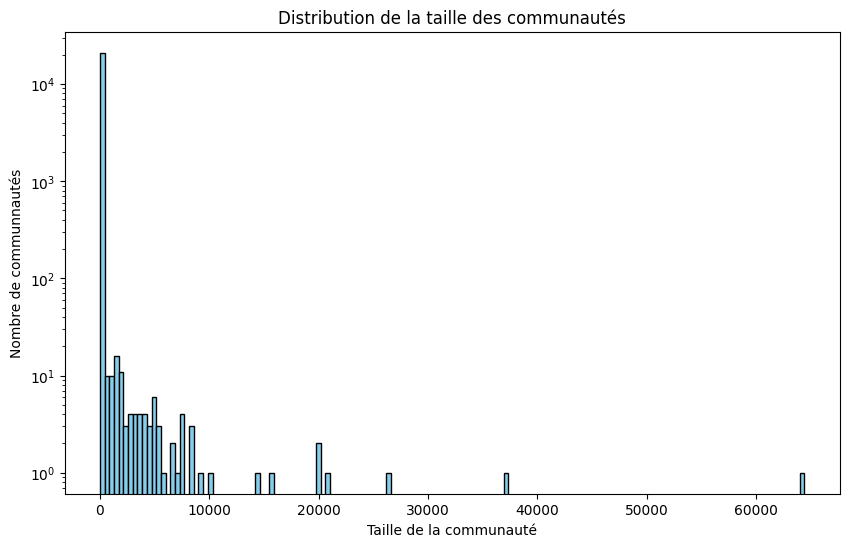

In [124]:
# Create a density histogram
def create_density_histogram():
    community_sizes = Counter(membership.values())
    plt.figure(figsize=(10, 6))
    plt.hist(list(community_sizes.values()), bins=150,  color='skyblue', edgecolor='black')
    plt.xlabel('Taille de la communauté')
    plt.ylabel('Nombre de communnautés')
    plt.title('Distribution de la taille des communautés')
    plt.yscale('log')  # Use log scale for better visualization if there are large differences
    plt.show()
create_density_histogram()

L’algorithme de Louvain calcule la modularité, qui mesure la densité des liens au sein d’une communauté comparée à celle entre communautés. Lorsqu’elle n’augmente plus, il regroupe les nœuds d’une même communauté en un super-nœud. Le graphe est alors réduit à un plus petit nombre de super-nœuds, et on répète ce processus itérativement jusqu’à ce qu’aucune amélioration de la modularité ne soit possible.

- On peut choisir la taille de nos communautés via l’hyper-paramètre “résolution”
  - Valeurs plus élevées → communautés plus petites et plus serrées
  - Valeurs plus faibles → moins de communautés, plus grandes
    - Avec resolution = 1 on obtient 30 890 communautés
    - Avec resolution = 0,5 on obtient 30 973 communautés
    
- Ce résultat semble bizarre, on a diminué la résolution et pourtant il a crée 83 communautés de plus (sur 31 000 communautés ce nombre est négligeable mais reflète la sensibilité de Louvain et nous montre encore une fois la sparsité et la dispersion de notre réseau.)
  - Dans notre cas, sur 30 000 communautés, la quasi-totalité sont des micro-groupes de <10 noeuds, ils ne changent donc pas quel que soit la  résolution, puisqu’il n’y a pas assez de poids d’arêtes pour justifier leur fusion
  - Seules quelques communautés plus grandes bougent réellement avec la résolution. Donc le nombre total de clusters reste à peu près constant, et une variation de quelques dizaines est tout à fait normale.
  - À deux valeurs de de la résolution différentes, on peut tomber sur deux maxima locaux distincts, qui ne respectent pas forcément une relation strictement monotone du nombre de clusters. On va vérifier cela en traçant le nb de communautés vs la résolution pour voir l'impacte du changement de la résolution.

- La résolution 0.8 favorise les communautés plus larges. Pourtant, on voit toujours une multitude de micro-communautés. 
  - Un pic écrasant sur la toute première barre (communautés de taille 1 ou 2) : la grande majorité des communautés regroupent <10 auteurs. Correspondent sans doute à des binômes ou trinômes de recherche très spécialisés.
  - Une queue très longue : quelques dizaines de communautés de taille intermédiaire (quelques milliers d’auteurs).
  - Deux grosses communautés en bout de queue (> 50 000 et > 90 000 nœuds) qui concentrent ¼ du réseau. On peut penser que ce ne sont pas des équipes de chercheurs soudées, ce sont des collaborations ponctuelles ou rares. Peut être formé de doctarants qui n’ont collaboré que quelques fois, leur carrière vient de commencer. Peut être aussi de co-auteurs de publications massives, ils font partie de publications avec des dizaines d’auteurs, ils sont responsables d’une petite partie de l’article et ils n’ont aucune relation avec la plupart des co-auteurs de l’article.
- Piste: Augmenter la modularité pour capturer des communautés plus faibles au sein de ce méga-cluster ou bien faire le contraire, diminuer la modularité et essayer de rassembler dans des méga-noeuds les petites commuautés
Conclusion 2: à compléter quand j’aurais tourné Louvain avec une modularité plus basse


In [143]:
import pandas as pd

# Trouver la communauté avec le plus de nœuds
largest_community = max(communities, key=len)

# Sauvegarder les noms des auteurs dans un CSV
df_largest = pd.DataFrame({'author': list(largest_community)})
df_largest.to_csv('largest_community_authors.csv', index=False)
print("CSV sauvegardé sous 'largest_community_authors.csv'")

CSV sauvegardé sous 'largest_community_authors.csv'


In [149]:
import pandas as pd

# 1. Charger le CSV des auteurs de la plus grande communauté
largest_df = pd.read_csv("largest_community_authors.csv")
# Supposons qu’il y a une colonne "author" ou "authors" listant un auteur par ligne
# Si c’est une seule colonne "authors" avec plusieurs auteurs par ligne, adaptez ci-dessous.
largest_authors = set(largest_df["author"].str.strip())

# Calculer la moyenne du poids des arêtes connectant chaque paire d'auteurs dans largest_authors
def average_edge_weight_for_authors(graph, author_set):
    """
    Calcule la moyenne des poids des arêtes connectant les paires d'auteurs dans author_set.
    """
    total_weight = 0
    edge_count = 0
    
    for u, v, edata in graph.edges(data=True):
        if u in author_set and v in author_set:
            total_weight += edata.get('weight', 0)
            edge_count += 1
    
    return total_weight / edge_count if edge_count > 0 else 0

average_weight = average_edge_weight_for_authors(G_science, largest_authors)
print(f"Moyenne du poids des arêtes connectant les paires d'auteurs dans largest_authors : {average_weight:.2f}")

# 2. Fonction qui récupère les titres uniques pour ces auteurs
def get_titles_for_authors(df_science, author_set):
    """
    Filtre df_science sur les lignes où au moins un auteur appartient à author_set,
    puis retourne la liste des titres (uniques).
    """
    # Préparer un set pour accélérer la recherche
    titles = set()
    
    for authors_str, title in zip(df_science["authors"], df_science["title"]):
        # Split & strip : obtenir la liste des auteurs pour cette ligne
        row_authors = [a.strip() for a in authors_str.split(",")]
        # Si intersection non vide, on conserve le titre
        if author_set.intersection(row_authors):
            titles.add(title)
    
    return list(titles)

# 3. Exemple d’usage
unique_titles = get_titles_for_authors(df_science, largest_authors)
print(f"{len(unique_titles)} titres trouvés :")
for t in unique_titles:
    print(" -", t)


Moyenne du poids des arêtes connectant les paires d'auteurs dans largest_authors : 1.41
100011 titres trouvés :
 - Algorithmic analysis towards time-domain extended source waveform
  inversion
 - Deep learning for action spotting in association football videos
 - PRIVEE: A Visual Analytic Workflow for Proactive Privacy Risk Inspection
  of Open Data
 - GET-UP: GEomeTric-aware Depth Estimation with Radar Points UPsampling
 - Nonsimple closed geodesics with given intersection number on hyperbolic
  surfaces
 - Simplex Search Based Brain Storm Optimization
 - Simulated redistricting plans for the analysis and evaluation of
  redistricting in the United States
 - Multi-Axis Support-Free Printing of Freeform Parts with Lattice Infill
  Structures
 - Linear Recognition of Almost Interval Graphs
 - The diffusive limits of two species Vlasov-Maxwell-Boltzmann equations
 - VFDS: Variational Foresight Dynamic Selection in Bayesian Neural
  Networks for Efficient Human Activity Recognition
 - GJR

In [147]:
largest_df.shape

(64416, 1)

In [72]:
import random

# `communities` is my list of sets from louvain_communities
n_comms = len(communities)

# 1. Pick 3 distinct community indices
chosen_ids = random.sample(range(n_comms), 6)

for cid in chosen_ids:
    comm_nodes = list(communities[cid])
    # 2. Sample up to 20 authors (if the community has fewer than 20 nodes, sample all)
    sample_authors = random.sample(comm_nodes, min(20, len(comm_nodes)))
    # 3. Print them
    print(f"\nCommunity #{cid} (size {len(comm_nodes)}):")
    for a in sample_authors:
        print("  ", a, ":", G_science.nodes[a]['primary_category'])



Community #15669 (size 3):
    Siting Huang : stat
   Yongchang Hui : stat
    Yuteng Zhang : stat

Community #1883 (size 2):
    Alfred M. Grundland : math
   Paul Bracken : math

Community #121 (size 2):
    Nick Birbilis : cs
   Shujing Zhao : cs

Community #6304 (size 5):
    S. Maleki-Roudposhti : math
    F. Farshadifar : math
   H. Ansari-Toroghy : math
    S. Keyvani : math
    F. Mahboobi-Abkenar : math

Community #16557 (size 7):
    Jose Andres Gomez Gandia : cs
    Carlos Milan Figueredo : cs
    M. Teresa del Val Nunez : cs
   Carlos Luengo Vera : cs
    Ignacio Ferro Picon : cs
    Victor Ramos Arroyo : cs
    Antonio de Lucas Ancillo : cs

Community #30524 (size 2):
   Yunus C. Aybas : econ
    Eray Turkel : econ


- Community #10475 (size 3):
    - A M Mathai: indian, McGill University 
    - Joy Jacob: indian, Cochin University of Science & Technology
    - Sebastian George: indian, Kannur University

- Community #30570 (size 4):
    - Kiran Mantripragada: Indian, Ontario Tech University​
    - Shima Rezasoltani: Iranian, Ontario Tech University​
    - Faisal Z. Qureshi: Pakistani, Ontario Tech University​
    - Soham Chitnis: Indian, New York University

- Community #12908 (size 3):
    - Delphine Boucher: French, University of Rennes 1​
    - Félix Ulmer: French, University of Rennes 1​
    - Willi Geiselmann: German, Karlsruhe Institute of Technology

- Community #30765 (size 2):
    - Matthew Barth: American, University of California, Riverside​
    - Saswat Priyadarshi Nayak: Indian, University of California, Riverside​

- Community #14505 (size 12):
    - S. Pfenninger: Swiss, Delft University of Technology ​
    - S. Zachary: Information not found​
    - I. Staffell: British, Imperial College London ​
    - K. Schell: American, University of San Francisco ​
    - S. H. Tindemans: Dutch, Delft University of Technology ​
    - M. Lynch: American, Arizona State University ​
    - H. Zareipour: Canadian, University of Calgary ​
    - A. L. Wilson: American, University of Tennessee ​
    - S. Awara: American, National Renewable Energy Laboratory ​
    - R. Sioshansi: American, Carnegie Mellon University ​
    - C. J. Dent: Information not found​
    - N. Samaan: American, Pacific Northwest National Laboratory

- Community #47 (size 2):
    - S. Nechaev: Russian, Lomonosov Moscow State University ​
    - K. Polovnikov: Russian, Lomonosov Moscow State University

- Community #15142 (size 13):
    - Grylia Yaneth Chata Iscarra: Peruvian, Universidad Nacional del Altiplano​
    - Josefh J. Quispe-Morales: Peruvian, Universidad Nacional del Altiplano​
    - Nadine Aceituno-Moya: Peruvian, Universidad Nacional del Altiplano​
    - Lindell Dennis Vilca-Mamani: Peruvian, Universidad Nacional del Altiplano​
    - Cliver W. Vilca-Tinta: Peruvian, Universidad Nacional del Altiplano ​
    - Henry Juarez-Vargas: Peruvian, Universidad Nacional del Altiplano ​
    - Yhack Bryan Aycaya-Paco: Peruvian, Universidad Nacional del Altiplano​
    - Wladimir A. Carlosviza-Amanqui: Peruvian, Universidad Nacional del Altiplano​
    - Luz B. Valenzuela-Narvaez: Peruvian, Universidad Nacional del Altiplano​
    - Roger Mijael Mansilla-Huanacuni: Peruvian, Universidad Nacional del Altiplano​
    - Tony Gabriel-Fernandez Cayo: Peruvian, Universidad Nacional del Altiplano​
    - Rubi Melania Coasaca Callacondo: Peruvian, Universidad Nacional del Altiplano

Ainsi, nous pouvons clairement voir que les communautés ont regroupé des personnes du même pays, qui recherchent dans le même domaine, mais aussi que les personnes d'une même communauté proviennent souvent de la même université (cette dernière information a été recherchée sur Internet car l'université ou le pays ne sont pas des informations présentes dans la base de données).



In [ ]:
for i, comm in enumerate(communities[:5]):
    print(f"Community #{i} (size {len(comm)}):")
    print(list(comm)) 
    print()

Community #0 (size 3187):
['Theodor Chakhachiro', 'Thomas Orth', 'Summanta Pattanaik', 'Ting Hua', 'Zachary McBride Lazri', 'Andrea Zanon', 'Mohammad R. Saeedpour-Parizi', 'Arpita Soni', 'Shawon Sarkar', 'Suwen Gu', 'Vivek Mange', 'Rafael Bassi Stern', 'Matthew Albert Chan', 'Marco Moltisanti', 'David Jacobs', 'Nirmesh J. Shah', 'Stephen M. Blackburn', 'Maria Hybinette', 'Suhas Eswarappa Prameela', 'Shivam Ratnakant Mhaskar', 'Alan Mishler', 'Nima Chitsazan', 'Aadyant Khatri', 'Longge Yuan', 'Jennifer Magana', 'Eric Penner', 'Qingyi Chen', 'Didier Auroux', 'Giuseppe Canonaco', 'Prateksha Udhayanan', 'Sharmila Duppala', 'Shahir Mowlaei', 'Daviti Jibuti', 'Rachit Mittal', 'Sanket Kalwar', 'Aritra Marik', 'Cornelia Fermüller', 'Peter Trinh', 'Chris Williams', 'Prasad M Desphande', 'Chae Woo Lim', 'Yifan Weng', 'Ing-Ray Chen', 'Manu Joseph', 'Aaquib Syed', 'Douglas Summers-Stay', 'Michael Schebek', 'Yuanyang Chang', 'Ling Guan', 'Geoffrey T. Manley', 'Ram Shringar Raw', 'Martynas Jagutis',

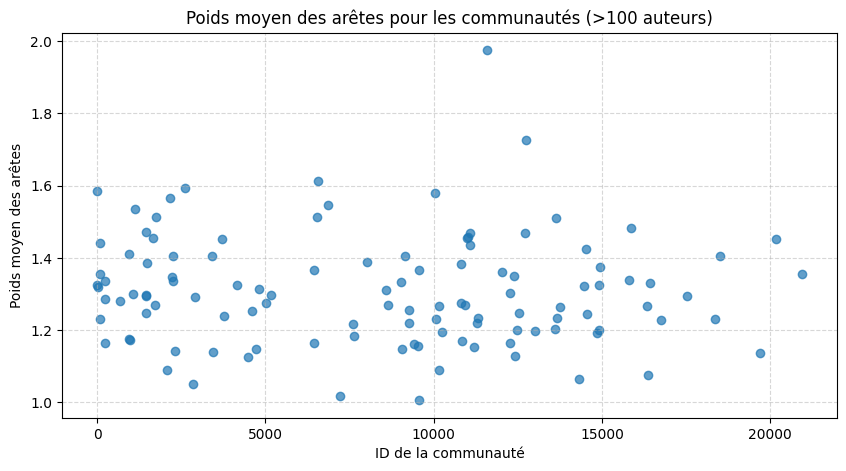

In [126]:

# Calculer le poids moyen des arêtes pour les communautés de plus de 100 auteurs
community_means = []
community_ids = []

for cid, comm in enumerate(communities):
    if len(comm) > 100:
        subg = G_science.subgraph(comm)
        weights = [edata['weight'] for _, _, edata in subg.edges(data=True)]
        mean_weight = np.mean(weights) if weights else 0
        community_means.append(mean_weight)
        community_ids.append(cid)
            

plt.figure(figsize=(10, 5))
plt.scatter(community_ids, community_means, alpha=0.7)
plt.xlabel("ID de la communauté")
plt.ylabel("Poids moyen des arêtes")
plt.title("Poids moyen des arêtes pour les communautés (>100 auteurs)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

In [111]:
# Trouver la communauté avec le plus de nœuds
largest_community = max(communities, key=len)

# Afficher les auteurs de cette communauté
print(f"Nombre d'auteurs dans la plus grande communauté : {len(largest_community)}")
print("Auteurs dans la plus grande communauté :")
for author in largest_community:
    print(author)

Nombre d'auteurs dans la plus grande communauté : 64416
Auteurs dans la plus grande communauté :
Dahuang Liu
Todd Davies
Gang Zhao
Shaoshen Chen
Zhe Weng
Sergey Loyka
Huaicheng Yan
Zhangju Liu
Xiaoyan Fu
Daniel Graves
Yu-Chu Lin
Maram Kurdi
Shuai Yang
Shakhrul Iman Siam
Quanwei Lin
Kejiang Chen
Chong MO
Hok Wai Tsui
Xingye Kan
Hsiao-Chun Wu
Zongqian Li
Jean Yeh
Kartik K. Kansal
Hebo Ma
De Wen Soh
Augustus Hong
Yueheng Sun
Haofen Wang
Meiqi Feng
Yohsuke Shiiki
Mika Hämäläinen
Funing Hou
chunbo Cheng
Chetan Sharma
Yi Tian Xu
Peter Cederberg
Yunfei Song
Baoyi An
Kamran Turkoglu
Ruike Zhang
Inma Cobos
Raja Kushlanagar
Yajie Yang
Kaixin Gao
Diana M. Negoescu
Mingyi Liu
Aquib Iqbal
Jilin Zhao
shaoxing Qu
Yuan Su
Yulin Qiu
JianHuang Lai
Weiwei Ao
Jianlong Jin
John Bird
Jingyang Qiao
Enchao Gong
Shanhui Zhao
Ilija Ilievski
Fan Xing
Sen Nie
Thomas D. Pike
Alexander Heußner
Varun Vasudevan
Feisi Fu
Pengfei Yan
Mircea Stan
Qingchun Bai
Euiyong Park
Yuxuan Bian
Yuequn Li
Xintong Han
Xiaoli Dong
Ya

### Structure de petit monde?

- J’ai vu qu’il y a un gros méga–cluster, relié par d’innombrables liens de poids 1–2. Ces liens faibles ont le role de conecter différentes petites communautés denses, ce qui est justement la clef des réseaux « petit monde » (chemins courts + forte cohésion locale). 
- Mais vu qu’on a plein de binomes de connectés, il y a que la plus grande composante connexe qui peut etre un petit monde. Dans un réseau ordonnée le C et le L sont élevés, dans un réseau construit de manière totalement random C et L sont très faibles, dans un petit monde, C est élevé et L est faible. 
- On pense faire cet étude sur la grande composante connexe. Comment?
- Extraire la plus grande composante connexe de notre graphe. Calculer C = coefficient de clustering moyen et L = longueur moyenne des plus courts chemins. Puis construire un graphe aléatoire de même taille et même distribution de degrés, et calculer C_rand et L_rand pour celui-là. On comparera les résultats. 
  - Si C/C_rand>=1 (ici testé>10) pour s’assurer d’une forte cohésion locale.
  - L/L_rand ≈ 1 (ici tolérance 0.5–2) pour vérifier que les distances globales restent courtes.

In [ ]:
giant = max(nx.connected_components(G_science), key=len)
Gg = G_science.subgraph(giant)
relative_size = Gg.number_of_nodes() / G_science.number_of_nodes()
print(f"Taille relative du plus grand composant connexe :{Gg.number_of_nodes()} / {G_science.number_of_nodes()} = {relative_size:.4f}")



Taille relative du plus grand composant connexe :507595 / 581712 = 0.8726


In [ ]:
mean_weight_giant = np.mean([edata['weight'] for _, _, edata in Gg.edges(data=True)])
print(f"Moyenne des poids des arêtes de la composante géante : {mean_weight_giant:.4f}")

Moyenne des poids des arêtes de la composante géante : 1.3044


La composante géante est un critère purement topologique (connexion vs non-connexion), c’est la plus grande sous-partie du graphe dans laquelle chaque paire de nœuds est reliée par au moins un chemin. La plus grande composante connexe de notre graphe est comprise de 87,26% des noeuds totaux.


In [137]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from collections import deque

def analyze_giant_component(G, sample_size=5000, n_hubs=100):
    """
    Analyse la cohésion locale et les propriétés petit-monde sur un sous-graphe
    représentatif de la composante géante en conservant les hubs et la connexité.

    Stratégie de sous-échantillonnage BFS:
    1. Extraction de la composante géante.
    2. Sélection des n_hubs nœuds de plus fort degré comme points de départ.
    3. Parcours en largeur (BFS) simultané depuis ces hubs pour collecter des nœuds
       jusqu'à atteindre sample_size.
    4. Création du sous-graphe induit, garantissant qu'il reste connexe.
    5. Calcul et affichage des métriques (clustering, distances, petit-monde).
    """
    # 1. Extraire la composante géante
    components = list(nx.connected_components(G))
    giant_nodes = max(components, key=len)
    Gg = G.subgraph(giant_nodes).copy()
    total_nodes = Gg.number_of_nodes()

    # Si la composante est déjà de taille réduite
    if sample_size >= total_nodes:
        Gs = Gg
    else:
        # 2. Identifier les hubs
        deg = dict(Gg.degree())
        hubs = sorted(deg, key=deg.get, reverse=True)[:n_hubs]

        # 3. BFS multiple sources
        visited = set()
        queue = deque()
        # initialiser la file avec les hubs
        for hub in hubs:
            visited.add(hub)
            queue.append(hub)
        # étendre la BFS jusqu'à avoir assez de nœuds
        while queue and len(visited) < sample_size:
            node = queue.popleft()
            for neighbor in Gg.neighbors(node):
                if neighbor not in visited:
                    visited.add(neighbor)
                    queue.append(neighbor)
                if len(visited) >= sample_size:
                    break
        # sous-graphe induit
        Gs = Gg.subgraph(visited).copy()

    # 4. Mesures
    C = nx.average_clustering(Gs, weight=None)
    L = nx.average_shortest_path_length(Gs, weight=None)

    # graphe aléatoire de référence
    deg_seq = [d for _, d in Gs.degree()]
    R = nx.expected_degree_graph(deg_seq, selfloops=False)
    C_rand = nx.average_clustering(R)
    L_rand = nx.average_shortest_path_length(R)

    # ratios et test petit-monde
    ratio_C = C / C_rand
    ratio_L = L / L_rand
    is_sw = (ratio_C > 10) and (0.5 <= ratio_L <= 2)

    # 5. Affichage
    print("=== Sous-graphe connexe représentatif ===")
    print(f"Taille composante géante : {total_nodes} nœuds")
    print(f"Taille sous-graphe BFS    : {Gs.number_of_nodes()} nœuds\n")
    print(f"C = {C:.4f}, C_rand = {C_rand:.4f} → C/C_rand = {ratio_C:.2f}")
    print(f"L = {L:.2f}, L_rand = {L_rand:.2f} → L/L_rand = {ratio_L:.2f}\n")
    if is_sw:
        print("Comportement PETIT-MONDE observé :")
        print(" - Clustering local bien supérieur à l'aléatoire")
        print(" - Chemins moyens comparables au modèle aléatoire")
    else:
        print("Pas de comportement petit-monde selon ces critères.")
        if ratio_C <= 10:
            print(" - Clustering trop faible comparé à l'aléatoire.")
        if not (0.5 <= ratio_L <= 2):
            print(" - Distance moyenne éloignée du modèle aléatoire.")

    # 6. Histogrammes
    lengths = dict(nx.all_pairs_shortest_path_length(Gs, weight=None))
    dist = [d for _, targets in lengths.items() for d in targets.values()]
    plt.figure()
    plt.hist(dist, bins=30)
    plt.title('Distribution des distances')
    plt.axvline(np.mean(dist), linestyle='--')
    plt.show()

    clustering_vals = list(nx.clustering(Gs, weight=None).values())
    plt.figure()
    plt.hist(clustering_vals, bins=30)
    plt.title('Distribution clustering local')
    plt.axvline(C, linestyle='--')
    plt.show()

    return Gs
Gs = analyze_giant_component(G_science, sample_size=50000, n_hubs=100)


KeyboardInterrupt: 

In [ ]:
# Mesurer le clustering moyen
C = nx.average_clustering(Gg, weight=None)

# Mesurer la distance moyenne
L = nx.average_shortest_path_length(Gg, weight=None)

# Construire un graphe aléatoire de référence
deg_seq = [d for _,d in Gg.degree()]
R = nx.expected_degree_graph(deg_seq, selfloops=False)
C_rand = nx.average_clustering(R)
L_rand = nx.average_shortest_path_length(R)

# Calcul des ratios
ratio_C = C / C_rand
ratio_L = L / L_rand

# Test des conditions petit-monde
is_small_world = (ratio_C > 10) and (0.5 <= ratio_L <= 2)

# Affichage des résultats
print("=== Propriétés Petit-Monde sur la plus grande composante ===")
print(f"C = {C:.4f},  C_rand = {C_rand:.4f}  →  C/C_rand = {ratio_C:.2f}")
print(f"L = {L:.2f},  L_rand = {L_rand:.2f}  →  L/L_rand = {ratio_L:.2f}\n")

if is_small_world:
    print("Le réseau se comporte comme un PETIT-MONDE :")
    print("   • Cohésion locale très supérieure à un modèle aléatoire")
    print("   • Chemins moyens comparables à ceux d’un graphe aléatoire")
else:
    print("Le réseau NE se comporte PAS comme un petit-monde selon ces critères.")
    if ratio_C <= 10:
        print("   – Le clustering n’est pas suffisamment plus élevé que l’aléatoire.")
    if not (0.5 <= ratio_L <= 2):
        print("   – La distance moyenne diffère trop de celle du graphe aléatoire.")



KeyboardInterrupt: 

### Rôles

1. Chercher des ponts en utilisant la catégorie primaire
 - compute a “bridge score” = number of edges to other categories. For each node, count how many of its edges lie in a different category than its primary category. Intuitively, this measures how “cross‐disciplinary” an author is.

 - For each of the 4 primary categories, pick the node with the highest bridge_score. This yields four authors—one per category—who serve as the main “bridges” to other fields.

2. Chercher des ponts en utilisant la centralité intermédiaire
 - Pour chaque paire de catégories, on balaie tous les auteurs de A, on compte leurs voisins dans B et on regarde leur betweenness globale.
 - On choisit celui qui maximise d’abord le nombre de voisins dans B, puis, en cas d’égalité, la betweenness.


In [ ]:
bridge_score = {}
for node in G_science:
    pc = primary_cat[node]
    # count edges whose category ≠ this node’s primary_category
    cross = sum(1 for _, _, ed in G_science.edges(node, data=True)
                if ed['category'] != pc)
    bridge_score[node] = cross

In [ ]:
best_bridges = defaultdict(lambda: (None, -1))
for node, score in bridge_score.items():
    pc = primary_cat[node]
    # this author’s score bigger than the current stored best score for that category
    if node==' Jr.':
        continue 
    if pc and score > best_bridges[pc][1]:
        best_bridges[pc] = (node, score)

In [ ]:
# Show results
for cat, (author, score) in best_bridges.items():
    print(f"Category '{cat}': bridge author = {author!r} with {score} cross‐category edges and in community {G_science.nodes[author]['louvain_community']}")

Category 'cs': bridge author = ' Michael I. Jordan' with 162 cross‐category edges and in community 5646
Category 'stat': bridge author = ' Shu Yang' with 99 cross‐category edges and in community 2151
Category 'math': bridge author = 'Noga Alon' with 80 cross‐category edges and in community 5646
Category 'econ': bridge author = ' Yimin Wei' with 48 cross‐category edges and in community 2151


In [ ]:
cats = sorted({c for c in primary_cat.values() if c is not None})

# 1) PERSONNES-PONT entre chaque paire (A→B) : 
# auteurs de A avec le PLUS de voisins dans B et un betweenness élevé.
betw = nx.betweenness_centrality(G_science, weight='weight')

bridges = {}
for c1, c2 in combinations(cats, 2):
    # candidats dans c1 → voisins dans c2
    scores = []
    for u in G_science.nodes:
        if primary_cat.get(u) != c1:
            continue
        nbrs_in_c2 = sum(1 for v in G_science[u] if primary_cat.get(v)==c2)
        if nbrs_in_c2>0:
            scores.append((u, nbrs_in_c2, betw[u]))
    # Triez d’abord par voisins (desc), puis par betw (desc)
    scores.sort(key=lambda x: (x[1], x[2]), reverse=True)
    if scores:
        u, nbrs, b = scores[0]
        bridges[(c1,c2)] = (u, nbrs, b)

print(">>> Personnes-pont (A→B) : (auteur, #voisins_B, betweenness)")
for (c1,c2), (u,nv,b) in bridges.items():
    print(f"  {c1:>6}→{c2:<6} : {u!r}, voisins={nv}, betw={b:.4f}")



### Centralité

##### Chercher des leaders de deux manières différentes

- Degré : extrait le sous-graphe de chaque catégorie et prend le nœud de degré pondéré maximal.
- Betweenness : même chose mais avec la mesure de betweenness sur chaque sous-graphe.

In [ ]:
# LEADERS par catégorie
# a) par centralité de degré (pondéré)
leaders_deg = {}
for c in cats:
    sub = G_science.subgraph([u for u in G_science if primary_cat.get(u)==c])
    # degree pondéré
    deg = sub.degree(weight='weight')
    u, d = max(deg, key=lambda x: x[1])
    leaders_deg[c] = (u, d)

# b) par betweenness dans chaque sous-graphe
leaders_btw = {}
for c in cats:
    sub = G_science.subgraph([u for u in G_science if primary_cat.get(u)==c])
    btw_sub = nx.betweenness_centrality(sub, weight='weight')
    u, b = max(btw_sub.items(), key=lambda x: x[1])
    leaders_btw[c] = (u, b)

print("\n>>> Leaders par degré (catégorie: auteur, degré_pondéré)")
for c, (u,d) in leaders_deg.items():
    print(f"  {c:>8} : {u!r}, degré={d}")

print("\n>>> Leaders par betweenness (catégorie: auteur, betweenness)")
for c, (u,b) in leaders_btw.items():
    print(f"  {c:>8} : {u!r}, betw={b:.4f}")



##### Plus court chemin
1. Technique: on échantillonne 1000 paires, on calcule la plus courte distance, on plot la distribution des distances et on fait la moyenne. Pour:
- Distance tous → leader
- Auteur aléatoire ↔ auteur aléatoire dans la meme catégorie
- Distance moyenne entre deux auteurs random dans toutes les categories
2. Analyse du degré de séparation pour la grande composante

In [ ]:
import random

def analyze_distance_distributions(G, primary_cat, leaders_deg, n_samples=1000):
    """
    Pour G (avec node attr primary_category) :
      1) Distance(auteur → leader) : échantillonnage de n_samples auteurs par catégorie,
         calcul de leur distance au leader, tracé de l’histogramme et moyenne.
      2) Distance random_intra : pour chaque catégorie, on tire n_samples paires
         (u,v) dans la même catégorie, calcule leur distance, trace et moyenne.
      3) Distance random_any : on tire n_samples paires de nœuds au hasard dans G,
         calcule leur distance, trace et moyenne.
    leaders_deg doit être un dict {cat: (leader_node, deg)}.
    """
    # Préparation : on travaillera sur le plus grand composant pour éviter les isolés
    comp0 = max(nx.connected_components(G), key=len)
    G0 = G.subgraph(comp0).copy()
    nodes0 = list(G0.nodes())
    
    # 1) auteur → leader
    fig, axes = plt.subplots(1, len(leaders_deg), figsize=(4*len(leaders_deg), 4))
    if len(leaders_deg)==1: axes = [axes]
    for ax, (cat, (leader, _)) in zip(axes, leaders_deg.items()):
        # échantillon d'auteurs dans la catégorie
        authors = [u for u in G0 if primary_cat.get(u)==cat]
        sample = random.sample(authors, min(n_samples, len(authors)))
        dists = []
        for u in sample:
            try:
                dists.append(nx.shortest_path_length(G0, u, leader))
            except nx.NetworkXNoPath:
                pass
        ax.hist(dists, bins=20)
        ax.axvline(sum(dists)/len(dists), color='k', linestyle='--')
        ax.set_title(f"Dist to leader ({cat})\nmean={sum(dists)/len(dists):.2f}")
        ax.set_xlabel('Distance')
        ax.set_ylabel('Count')
    plt.tight_layout()
    plt.show()

    # 2) random intra-cat
    fig, axes = plt.subplots(1, len(leaders_deg), figsize=(4*len(leaders_deg), 4))
    if len(leaders_deg)==1: axes = [axes]
    for ax, cat in zip(axes, leaders_deg):
        authors = [u for u in G0 if primary_cat.get(u)==cat]
        pairs = [random.sample(authors, 2) for _ in range(n_samples)]
        dists = []
        for u,v in pairs:
            try:
                dists.append(nx.shortest_path_length(G0, u, v))
            except nx.NetworkXNoPath:
                pass
        ax.hist(dists, bins=20)
        ax.axvline(sum(dists)/len(dists), color='k', linestyle='--')
        ax.set_title(f"Random intra {cat}\nmean={sum(dists)/len(dists):.2f}")
        ax.set_xlabel('Distance')
        ax.set_ylabel('Count')
    plt.tight_layout()
    plt.show()

    # 3) random any
    pairs = [random.sample(nodes0, 2) for _ in range(n_samples)]
    dists = []
    for u,v in pairs:
        try:
            dists.append(nx.shortest_path_length(G0, u, v))
        except nx.NetworkXNoPath:
            pass
    plt.figure(figsize=(5,4))
    plt.hist(dists, bins=20)
    plt.axvline(sum(dists)/len(dists), color='k', linestyle='--')
    plt.title(f"Random any-category\nmean={sum(dists)/len(dists):.2f}")
    plt.xlabel('Distance')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

    # Retour facultatif des trois séries de distances
    return {
        'to_leader': {cat: dists for cat, dists in zip(leaders_deg, None)},  # si besoin stocker par cat
        'intra_cat': {cat: dists for cat, dists in zip(leaders_deg, None)},
        'any': dists,
    }

analyze_distance_distributions(G_science, primary_cat, leaders_deg, n_samples=1000)


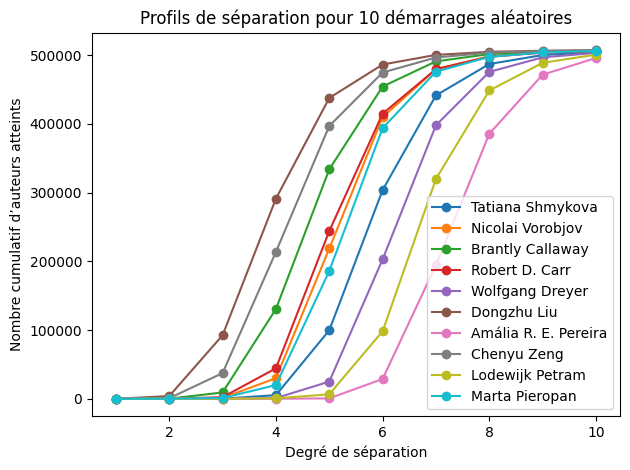

In [129]:
def run_random_separation(G, runs=10, max_deg=8, seed=None, plot=True):
    """
    Pour `runs` nœuds aléatoires dans le grand composant de G, calcule la taille
    cumulée de l'ensemble atteint à chaque degré de séparation (1..max_deg).
    Si plot=True, trace les `runs` courbes cumulatives pour comparer les profils.
    """
    if seed is not None:
        random.seed(seed)
    # grand composant
    comp0 = max(nx.connected_components(G), key=len)
    G0 = G.subgraph(comp0)
    nodes = list(G0.nodes())
    # tirage aléatoire de `runs` nœuds dans le grand composant
    starts = random.sample(nodes, runs)
    
    profiles = {}
    for s in starts:
        visited = {s}
        frontier = {s}
        cum_counts = []
        for d in range(1, max_deg + 1):
            #voisins de frontier
            neigh = set(nb for u in frontier for nb in G0.neighbors(u))
            # ne garder que les nouveaux
            new_front = neigh - visited
            visited |= new_front
            cum_counts.append(len(visited))
            frontier = new_front
            if not frontier:
                break
        profiles[s] = cum_counts

    if plot:
        plt.figure()
        for s, cum in profiles.items():
            plt.plot(range(1, len(cum) + 1), cum, marker='o', label=str(s))
        plt.xlabel('Degré de séparation')
        plt.ylabel('Nombre cumulatif d’auteurs atteints')
        plt.title('Profils de séparation pour 10 démarrages aléatoires')
        plt.legend()
        plt.tight_layout()
        plt.show()

    return profiles

# Utilisation
profiles = run_random_separation(G_science, runs=10, max_deg=10, seed=42, plot=True)

##### Transitivité

In [128]:
# TRANSITIVITÉ (global clustering) par catégorie
trans = {}
for c in cats:
    sub = G_science.subgraph([u for u in G_science if primary_cat.get(u)==c])
    trans[c] = nx.transitivity(sub)

print("\n>>> Transitivité (2m/[n(n-1)]) par catégorie")
for c, t in trans.items():
    print(f"  {c:>8} : {t:.4f}")

KeyboardInterrupt: 